# Comprensión de la música con Python, una mirada desde la Física y la Matemática
<br>

## Phd. Jose Ricardo Zapata 
<img style="float: right;" src="./Img/logopycon.png" width="320" height="50" alt = "PyCON 2020 - Coding and dreaming"><br>
PyCON 2020 - Coding and dreaming
<br>
Medellín - Colombia

**Nota:** Esta es una presentación de diapositivas en Jupyter Notebook para una mejor visualización de la presentación. Recomiendo instalar RISE (Reveal.js - Extensión de presentación de diapositivas de Jupyter / IPython): convierte las notebooks de Jupyter en una presentación en vivo, luego activa la pantalla completa en el navegador web (presione F11)

https://github.com/damianavila/RISE

# Acerca de Mi (https://joserzapata.github.io/)

Investigador y Docente en la Universidad Pontificia Bolivariana (UPB)
- Phd. Sound and music computing, Universitat Pompeu Fabra, Barcelona - España
- MEng. Telecomunicaciones y Ingeniero Electronico, UPB, Medellin - Colombia

#### Intereses de Investigación
- Music Information Retrieval
- Ciencia de Datos
- Procesamiento de señales de Audio

#### Docencia
Doctorado en Ingenieria y Msc TIC Linea Ciencia de Datos.

Ing. Electrónica, Telecomunicaciones, Informática, Diseño entretenimiento Digital, **Ing. Ciencia de Datos (Nuevo Programa UPB Medellin 2020)**

# MÚSICA (Definición RAE)

f. **Melodía, ritmo y armonía, combinados.**
- Ritmo (Orden de los sonidos y silencios en el tiempo)
- Melodía (sucesión de sonidos que es percibida como una sola entidad.)
- Armonía (Unión y combinación de sonidos simultáneos y diferentes, pero acordes)

# MÚSICA (Definición RAE)

1. f. Sucesión de sonidos modulados para recrear el oído.
1. f. **Arte de combinar los sonidos** de la voz humana o de los instrumentos, o de unos y otros a la vez, de suerte **que produzcan deleite**, conmoviendo la sensibilidad, ya sea alegre, ya tristemente.
1. f. **Sonido grato al oído.** 

# ¿ Cuando los sonidos suenan Agradable y Cuando No?

# Paquetes de Python

In [1]:
%matplotlib inline
import numpy as np # Manejo de datos numericos vectoriales y señales
import matplotlib.pyplot as plt #Libreria para realizar graficos
import pandas as pd
from matplotlib import animation, rc
rc('animation', html='jshtml')
from ipywidgets import interactive #Widgets interactivos
from IPython.display import Audio, display, HTML

from scipy.io import wavfile  #Importar Modulo scipy para leer audio

In [2]:
# Importar Plotly para realizar graficos interactivos
# conda install -c anaconda plotly 
from plotly import offline as py # Usar plotly en modo offline
import plotly.tools as tls
py.init_notebook_mode()
import warnings
warnings.filterwarnings("ignore") # Eliminar los Deprecation warnings

# ¿Que es el Sonido?
<center>
<img src='./Img/longipatm.gif'  alt="drawing" width="700">
</center>

# Principio de Superposición de Ondas
Cuando dos o más ondas se mueven a través de la misma región del espacio al mismo tiempo se suman.

Después de interactuar entre ellas, cada una de las ondas mantiene su forma original.
<center>
<img src='./Img/pulses.gif'  alt="drawing" width="300">
</center>


In [3]:
def suma_ondas_plot(f1=50, fase=0.0, tiempo = 0.1):
    plt.figure(figsize=(14, 7))
    rate = 6000 #numero de datos por segundo
    times = np.linspace(0,2,rate) #vector de tiempo
    if fase==3.1:fase=np.pi # El slider to puede tomar le valor de pi= 3.1416
    a_signal = np.sin(2*np.pi*f1*times+ fase) 
    b_signal = np.sin(2*np.pi*50*times)
    signal = a_signal + b_signal
    plt.subplot(3,1,1);plt.plot(times, a_signal); plt.title(f'Frecuencia = {f1} [=]Hz');plt.ylabel('Onda A        ',rotation=0);plt.xlim(0,tiempo)
    plt.subplot(3,1,2);plt.plot(times, b_signal,'r');plt.title(f'Frecuencia = 50 [=]Hz');plt.ylabel('Onda B     ',rotation=0);plt.xlim(0,tiempo)
    plt.subplot(3,1,3);plt.plot(times,signal,'m');plt.title('Efecto Pulsatorio o Batimento');plt.ylabel('Suma Ondas              ',rotation=0)
    plt.xlabel("Tiempo [=] Seg");plt.ylim(-2.1,2.1);plt.xlim(0,tiempo); plt.tight_layout()
suma_ondas = interactive(suma_ondas_plot, f1=(50,400), fase=(0.0,np.pi),tiempo=(0.1,1.0))

In [4]:
display(suma_ondas) #Visualizacion de las imagenes interactivas

interactive(children=(IntSlider(value=50, description='f1', max=400, min=50), FloatSlider(value=0.0, descripti…

# Efecto Pulsatorio (Batimiento)
Se genera al Superponerse dos ondas sinusoidales con frecuencias ligeramente distintas.

In [5]:
def beat_plot(f1=200.0, tiempo = 0.1):
    plt.figure(figsize=(14, 6))
    rate = 6000
    times = np.linspace(0,3,rate) #vector de cuatro segundos
    a_signal = np.sin(2*np.pi*f1*times) 
    b_signal = np.sin(2*np.pi*200*times)
    signal = a_signal + b_signal
    display(Audio(data=signal, rate=rate))
    plt.subplot(3,1,1);plt.plot(times, a_signal, lw=4)
    plt.title(f'Frecuencia = {f1} [=]Hz');plt.xlim(0,tiempo);plt.ylabel('Onda 1        ',rotation=0)
    plt.subplot(3,1,2);plt.plot(times, b_signal,'r',lw=4)
    plt.title(f'Frecuencia = 200 [=]Hz');plt.xlim(0,tiempo);plt.ylabel('Onda 2     ',rotation=0)
    plt.subplot(3,1,3);plt.plot(times,signal,'m',lw=4)
    plt.title('Efecto Pulsatorio o Batimento');plt.xlim(0,tiempo);plt.ylabel('Suma Ondas              ',rotation=0)
    plt.xlabel("Tiempo [=] Seg");plt.ylim(-2.1,2.1); plt.tight_layout()
            
beat_ondas = interactive(beat_plot, f1=(190,210), tiempo=(0.1,1))

In [6]:
display(beat_ondas) #visualizacion interactiva de las ondas

interactive(children=(IntSlider(value=200, description='f1', max=210, min=190), FloatSlider(value=0.1, descrip…

# Consonancia y Disonancia
- Consonancia es la "cualidad de aquellos sonidos que, oídos simultáneamente, producen efecto agradable."
- Disonancia "acorde no consonante", es la "cualidad de aquellos sonidos que, oídos simultáneamente, producen efecto no consonante."

La Disonancia ocurre cuando hay efecto pulsatorio.


In [7]:
from collections import OrderedDict
duration = 3
Fs = 4000
N = int(duration * Fs)
t = np.arange(0, N)/ Fs

def F_pitch(p):
    frequency = 2 ** (( p - 69 ) / 12 ) * 440
    return frequency

diff_semitones = ['0','1','2','3','4','5','6','7','8','9','10','11','12',]

JI_frac = ['$1:1$', '$15:16$', '$8:9$', '$5:6$', '$4:5$', '$3:4$', '$32:45$', 
                   '$2:3$', '$5:8$', '$3:5$', '$5:9$', '$8:15$', '$1:2$']
JI_ratio = np.asarray([1, 15/16, 8/9, 5/6, 4/5 , 3/4, 32/45, 2/3, 5/8, 3/5, 5/9, 8/15, 1/2])

pyt_frac = ['$1:1$', '$3^5:2^8$', '$2^3:3^2$', '$3^3:2^5$', '$2^6:3^4$', '$3:2^2$', '$2^9:3^6$', 
                   '$2:3$', '$3^4:2^7$', '$2^4:3^3$', '$3^2:2^4$', '$2^7:3^5$', '$1:2$']
pyt_ratio = np.asarray([1, 243/256, 8/9, 27/32, 64/81 , 3/4, 512/729, 2/3, 81/128, 16/27, 9/16, 128/243, 1/2])

p = 60
omega = F_pitch(p)
freq_JI = omega / JI_ratio 
freq_pyt = omega / pyt_ratio
notes = np.asarray(range(p, p + 13))
freq_center = F_pitch(notes)
freq_deviation_cents_JI =  np.log2(freq_JI / freq_center) * 1200
freq_deviation_cents_pyt =  np.log2(freq_pyt / freq_center) * 1200

def generate_sinusoid(omega, t):
    return np.sin(2 * np.pi * omega * t)

def generate_sinusoid_interval_list(freq_list, x_ref=[]):
    sinusoid_list = []
    for f in freq_list:
        s = generate_sinusoid(f, t)
        x = x_ref + s
        sinusoid_list.append(x)
    return sinusoid_list

x_ref = generate_sinusoid(omega, t)
sinusoid_center = generate_sinusoid_interval_list(freq_center, x_ref)
sinusoid_JI = generate_sinusoid_interval_list(freq_JI, x_ref)
sinusoid_pyt = generate_sinusoid_interval_list(freq_pyt, x_ref) 
sinusoid_sum = list(range(len(freq_center)))
for i in range(len(freq_center)):
    sinusoid_sum[i] = (sinusoid_center[i] + sinusoid_JI[i] + sinusoid_pyt[i])/3

# Generation of html table
def generate_audio_tag_html_list(sinusoid_freq_list, Fs):
    audio_tag_html_list = []
    for i in range(len(sinusoid_freq_list)):
        audio_tag = Audio( sinusoid_freq_list[i], rate=Fs)
        audio_tag_html = audio_tag._repr_html_().replace('\n', '').strip()
        audio_tag_html = audio_tag_html.replace('<audio ', 
                                                '<audio style="width: 110px; height: 50px;"')  
        audio_tag_html_list.append(audio_tag_html)
    return audio_tag_html_list

audio_tag_html_center = generate_audio_tag_html_list(sinusoid_center, Fs=Fs)
audio_tag_html_JI = generate_audio_tag_html_list(sinusoid_JI, Fs=Fs)
audio_tag_html_pyt = generate_audio_tag_html_list(sinusoid_pyt, Fs=Fs)
audio_tag_html_sum = generate_audio_tag_html_list(sinusoid_sum, Fs=Fs)


pd.options.display.float_format = '{:,.1f}'.format    
pd.set_option('display.max_colwidth', -1)    
df_inter = pd.DataFrame(OrderedDict([
    ('Diferencia', diff_semitones),
    ('Nombre del Intervalo', ['(Perfecto) unisono','Segunda menor','Segunda Mayor','Tercera Menor',
                       'Tercera Mayor','Cuarta Justa', 'Tritono','Quinta Justa',
                       'Sexta Menor', 'Sexta Mayor ','Septima Menor','Septima Mayor','(Perfecto) Octava']),
    ('Intervalo', ['Do 4 - Do 4','Do 4 - Do$^\sharp$4','Do 4 - Re4','Do 4 - Re$^\sharp$4','Do 4 - Mi4','Do 4 - Fa4',
                  'Do 4 - Fa$^\sharp$4','Do 4 - Sol4','Do 4 - Sol$^\sharp$4','Do 4 - LA4','Do 4 - LA$^\sharp$4', 
                  'Do 4 - Si4','Do 4 - Do 5']),
    ('Sonido simultaneo.', audio_tag_html_center), 
    ('Relacion ', JI_frac)]))

df_inter.index = np.arange(1, len(df_inter) + 1)

# Consonancia y Disonancia

In [8]:
HTML(df_inter.head(7).to_html(escape=False, index=False))

# ¿ Cuando No Suena Agradable?

Cuando las frecuencias de las ondas estan cerca y se presenta Efecto Pulsatorio

# ¿Cuando Suenan Agradable?

??????

# Ondas Estacionarias en una Cuerda
<br>
<br>
<center>
<img src='./Img/standingwaves.gif'>
</center>


# Ondas Estacionarias en una Cuerda
<br>
<br>
<center>
<img src='./Img/cuerda.gif'>
</center>

In [9]:
# Script para crear una onda estancionaria de media longitud de onda
#Longitud de la cuerda (mt)
L = np.pi
 
# Masa de la cuerda (kg)
m = np.pi
 
#Densidad de la cuerda (kg/mt)
mu = L/m
 
#Tension (N)
T = 1
 
# Velocidad de la onda en una cuerda
c = np.sqrt(T/mu)

#x axis
x0 = np.linspace(-np.pi,np.pi,10000)

# Tiempo inicial
t0 = 0

# Incrementos de Tiempo
dt = 0.05

# Solucion de la ecuacion de onda
def u(x,t):
    return 0.5*(np.cos(0.5*x+c*t) + np.cos(0.5*x-c*t))

a = []
for i in range(500):
    value = u(x0,t0)
    t0 = t0 + dt
    a.append(value)

k = 0
def animate(i):
    global k
    x = a[k]
    k += 1
    ax1.clear()
    plt.plot(x0,x, lw=4)
    plt.grid(True)
    plt.title('Modo 1 de Oscilacion en una Cuerda')
    plt.ylim([-2,2])
    plt.xlim([-np.pi,np.pi])

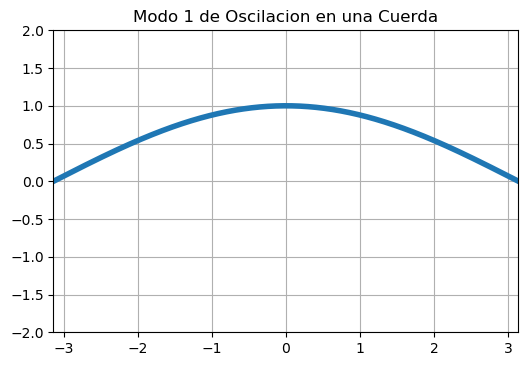

In [10]:
fig = plt.figure();fig.set_dpi(100);
ax1 = fig.add_subplot(1,1,1);
anim = animation.FuncAnimation(fig,animate,frames=125,interval=20)
anim

In [11]:
# Script para crear una onda estancionaria de una longitud de onda
# Solucion de la ecuacion de onda
def u(x,t):
    return 0.5*(np.sin(x+c*t) + np.sin(x-c*t))

a = []
for i in range(500):
    value = u(x0,t0)
    t0 = t0 + dt
    a.append(value)

k = 0
def animate(i):
    global k
    x = a[k]
    k += 1
    ax1.clear()
    plt.plot(x0,x, lw=4)
    plt.grid(True)
    plt.title('Modo 2 de Oscilacion en una Cuerda')
    plt.ylim([-2,2])
    plt.xlim([-np.pi,np.pi])

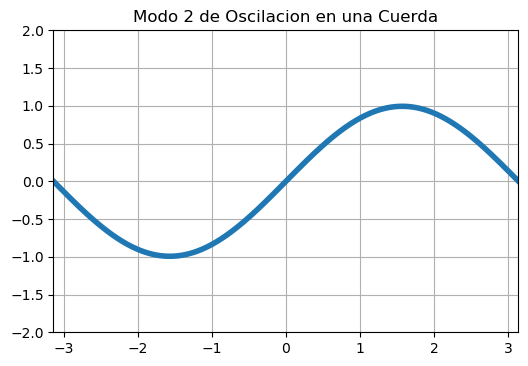

In [12]:
fig = plt.figure();fig.set_dpi(100)
ax1 = fig.add_subplot(1,1,1)
anim = animation.FuncAnimation(fig,animate,frames=125,interval=20)
anim

In [13]:
# Script para crear varias ondas estancionarias simultaneas
# Solucion de la ecuacion de onda
def phi(x):
    # generar varias ondas de frecuencias multiplos entre si
    return np.cos(x)**3
 
def u(x,t):
    return 0.5*(phi(0.5*x+c*t)+phi(0.5*x-c*t))

a = []
for i in range(500):
    value = u(x0,t0)
    t0 = t0 + dt
    a.append(value)

k = 0
def animate(i):
    global k
    x = a[k]
    k += 1
    ax1.clear()
    plt.plot(x0,x, lw=4)
    plt.grid(True)
    plt.title('Varios Modos de Oscilacion simultaneos en una Cuerda')
    plt.ylim([-2,2])
    plt.xlim([-np.pi,np.pi])

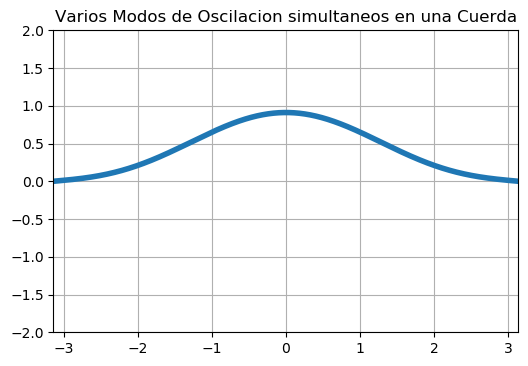

In [14]:
fig = plt.figure();fig.set_dpi(100)
ax1 = fig.add_subplot(1,1,1)
anim = animation.FuncAnimation(fig,animate,frames=125,interval=20);anim

# Espectro de Frecuencia de Sonidos Reales

### Tono Puro (Onda Sinusoidal)
Vamos a crear un tono artificial a 1047 HZ, equivalente a un DO en la sexta octava (C6)

In [15]:
T = 2.0 # segundos
f0 = 1047.0 #Frecuencia del tono
sr = 22050 # Frecuencia de Muestreo
t = np.linspace(0, T, int(T*sr), endpoint=False) # creacion del eje de tiempo
x = 0.8*np.sin(2*np.pi*f0*t) # Señal Sinusoidal
display(Audio(x, rate=sr))

#### Espectro del tono puro en C6

In [16]:
from scipy.fftpack import fft # modulo para calcular la transformada de fourier
X = fft(x[:4096]); X1_mag = np.absolute(X)       # Espectro de magnitud
f = np.linspace(0, sr, 4096)  # Vector de frecuencia
plt.figure(figsize=(12, 5));plt.plot(f[:2000], 10*np.log10(X1_mag[:2000])) # Espectro de magnitud
plt.xlabel('Frecuencia (Hz)');plt.grid(True);py.iplot(tls.mpl_to_plotly(plt.gcf())) #usar plotly para un grafico interactivo

### Oboe
Sonido de un oboe tocando un C6:

In [17]:
sr_oboe, x_oboe = wavfile.read('Data/oboe_c6.wav')
# Definir los valores de los datos de amplitud entre [-1 : 1] Audiodata.dtype es int16
x_oboe = x_oboe/ (2.**15)
Audio(x_oboe, rate=sr_oboe)

#### Espectro Sonido de Oboe en C6

In [18]:
X = fft(x_oboe[10000:14096])
X2_mag = np.absolute(X)
plt.figure(figsize=(13, 5))
plt.plot(f[:2000], 10*np.log10(X2_mag[:2000])) # Espectro de magnitud
plt.xlabel('Frecuencia (Hz)');plt.grid(True);
py.iplot(tls.mpl_to_plotly(plt.gcf())) #usar plotly para un grafico interactivo

### Clarinete
Clarinete tocando un C6

In [19]:
sr_clarinete, x_clarinete = wavfile.read('Data/clarinet_c6.wav')
x_clarinete = x_clarinete/ (2.**15)
Audio(x_clarinete, rate = sr_clarinete)

#### Espectro Sonido de Clarinete en C6

In [20]:
X = fft(x_clarinete[10000:14096])
X3_mag = np.absolute(X)
plt.figure(figsize=(13, 5))
plt.plot(f[:2000], 10*np.log10(X3_mag[:2000])) # magnitude spectrum
plt.xlabel('Frecuencia (Hz)');plt.grid(True);py.iplot(tls.mpl_to_plotly(plt.gcf())) #usar plotly para un grafico interactivo

#### Espectro de Do6 en Sinusoide, Oboe y Clarinete 

In [21]:
plt.figure(figsize=(12, 5))
plt.plot(f[:2000], 10*np.log10(X1_mag[:2000]),'r',label = 'Sinusoide') # Espectro Magnitud
plt.plot(f[:2000], 10*np.log10(X2_mag[:2000]),'b',label = 'Oboe') # Espectro Magnitud
plt.plot(f[:2000], 10*np.log10(X3_mag[:2000]),'g',label = 'Clarinete') # Espectro Magnitud
plt.xlabel('Frecuencia (Hz)');plt.legend();plt.grid(True);py.iplot(tls.mpl_to_plotly(plt.gcf())) #usar plotly para un grafico interactivo

In [22]:
# https://www.audiolabs-erlangen.de/resources/MIR/FMP/C1/C1S3_HarmonicSeries.html

# Calculo de las frecuencias a partir del Pitch
def F_pitch(p):
    frequency = 2 ** (( p - 69 ) / 12 ) * 440
    return frequency

p = 36
omega = F_pitch(p)
freq_harmonic = (np.asarray(range(16)) + 1) * omega
sinusoid_freq_harmonic = []

notes = np.asarray([36, 48, 55, 60, 64, 67, 70, 72, 74, 76, 78, 79, 80, 82, 83, 84])


# Generacion de sinusoides
duration = 4  # segundos
Fs = 4000  # Frecuencia de muestreo
num_samples = np.floor(Fs * duration).astype(int) + 1
t = np.linspace(0, duration, num_samples, endpoint=True) 


for f in freq_harmonic:
    x = np.sin(2 * np.pi * f * t)
    sinusoid_freq_harmonic.append(x)    

# Generacion de la Tabla HTML   
    
audio_tag_html_harmonic = []
for i in range(len(freq_harmonic)):
    audio_tag = Audio(sinusoid_freq_harmonic[i], rate = Fs)
    audio_tag_html = audio_tag._repr_html_().replace('\n', '').strip()
    audio_tag_html = audio_tag_html.replace('<audio ', '<audio style="width: 100px; "')    
    audio_tag_html_harmonic.append(audio_tag_html)

pd.set_option('display.max_colwidth', -1)    
df_ar = pd.DataFrame(OrderedDict([('Nota', ['Do 2', 'Do 3', 'Sol 3', 'Do 4', 'Mi 4', 'Sol 4',
                                         'B$^\\flat$4', 'C5', 'D5', 'E5', 'F$^\sharp$5',
                                         'G5', 'A$^\\flat$5', 'B$^\\flat$5', 'B5', 'C6']),
                               ('Frecuencia (Hz)', freq_harmonic),
                               ('Sonido Sinusoid', audio_tag_html_harmonic)]))                               
 
df_ar.index = np.arange(1, len(df_ar) + 1)

## Armonicos

In [23]:
HTML(df_ar.head(6).to_html(escape=False, float_format='%.2f')) #Cinco Primeros Armonicos

#### ¿Cuales Notas son Consonantes y Cuales Disonantes?

In [24]:
HTML(df_inter.to_html(escape=False, index=False))

In [25]:
# https://www.audiolabs-erlangen.de/resources/MIR/FMP/C5/C5S1_Chords.html
def generate_sinusoid_chord(pitches=[69], duration=1, Fs=4000, amplitude_max = 0.5):
    N = int(duration * Fs)
    t = np.arange(0, N)/ Fs
    x = np.zeros(N)
    for p in pitches:
        omega = 2 ** (( p - 69 ) / 12 ) * 440
        x = x + np.sin(2 * np.pi * omega * t)
    x = amplitude_max * x/np.max(x)
    return x

duration = 2
Fs = 4000

pitches = [60,64,67]
x_mayor = generate_sinusoid_chord(pitches=pitches, duration=duration, Fs=Fs)

pitches = [60,63,67]
x_menor = generate_sinusoid_chord(pitches=pitches, duration=duration, Fs=Fs)

pitches = [60,63,66]
x_dis = generate_sinusoid_chord(pitches=pitches, duration=duration, Fs=Fs)

pitches = [60,64,68]
x_aug = generate_sinusoid_chord(pitches=pitches, duration=duration, Fs=Fs)

In [26]:
print('Acorde Mayor = Fundamental, Tercera Mayor, Quinta ', flush=True);display(Audio(data=x_mayor, rate=Fs))
print('Acorde Menor = Fundamental, Tercera Menor, Quinta ', flush=True);display(Audio(data=x_menor, rate=Fs))
print('Acorde Disminuido = Fundamental, Tercera Menor, Quinta Disminuida', flush=True);display(Audio(data=x_dis, rate=Fs))
print('Acorde Aumentado = Fundamental, Tercera Menor, Quinta Aumentada', flush=True);display(Audio(data=x_aug, rate=Fs))

Acorde Mayor = Fundamental, Tercera Mayor, Quinta 


Acorde Menor = Fundamental, Tercera Menor, Quinta 


Acorde Disminuido = Fundamental, Tercera Menor, Quinta Disminuida


Acorde Aumentado = Fundamental, Tercera Menor, Quinta Aumentada


# ¿ Cuando No Suena Agradable?

Cuando las frecuencias de las ondas estan cercanas y se presenta Efecto Pulsatorio.

# ¿Cuando Suenan Agradable?

Cuando las frecuencias de las ondas son multiplos enteros entre si.

Los Acordes mayores estan formados por las notas que se obtienen de la frecuencia fundamental, tercer y quinto armonico de una onda de sonido. (Ejemplo: Do - Sol - Mi = Acorde de Do Mayor)

# ¡GRACIAS!

|  |  |
|---|---|
    |<img style="float:left" src="Img/website.png" width="40px" height="40px"/>|<h1 class="text-primary">joserzapata.github.io</h1>|
|<img style="float:left" src="Img/github.png" width="50px" height="50px"/>|<h1 class='text-muted'>@joserzapata</h1>|
|<img style="float:left" src="Img/blue-twitter.png" width="50px" height="50px"/>|<h1 class="text-info">@joserzapata</h1>|
|<img style="float:left" src="Img/mail.png" width="40px" height="40px"/>|<h1 class="text-warning">joserzapata [@] upb.edu.co</h1>|

# REFERENCIAS
- [Musica definicion RAE](http://lema.rae.es/drae2001/srv/search?id=mrTCGZ1jGDXX2Spz9U29)
- https://ipywidgets.readthedocs.io/en/stable/examples/Beat%20Frequencies.html
- https://www.acs.psu.edu/drussell/demos.html
- https://flothesof.github.io/1D-vibrating-string.html
- http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-as-interactive-javascript-widgets/
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C5/C5S1_Intervals.html